<a href="https://colab.research.google.com/github/plaban1981/Fastai/blob/master/Cotton_Plant_Disease_Detection_using_fastai.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [4]:
from fastai import *
from fastai.vision import *

In [7]:
import warnings
warnings.filterwarnings('ignore')

#Etract data using ImageDataBunch 

In [8]:
path = '/content/drive/My Drive/data'
data = ImageDataBunch.from_folder(path,train='train',valid='val',test='test',ds_tfms=get_transforms(),size=224).normalize(imagenet_stats)

## Text Labels

In [9]:
print(f' total number of classes {data.c}')

 total number of classes 4


In [10]:
print(f'class label : {data.classes}')

class label : ['diseased cotton leaf', 'diseased cotton plant', 'fresh cotton leaf', 'fresh cotton plant']


# Visualize the images using data batch

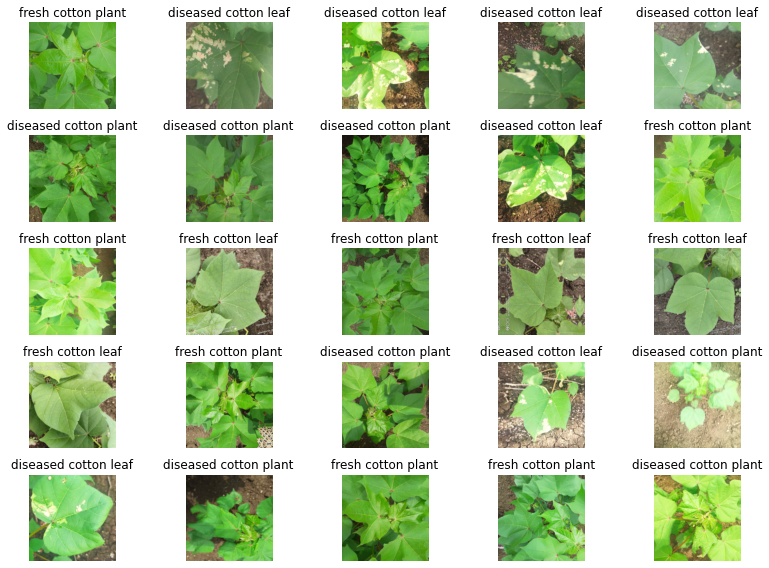

In [12]:
data.show_batch(rows=5,figsize=(11,8))

# Create Model

In [17]:
learn = create_cnn(data,models.resnet34,metrics=error_rate,model_dir='/content')

## Find optimum learning rate

In [18]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


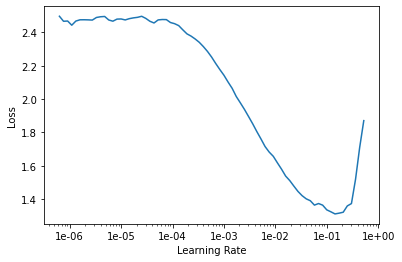

In [19]:
learn.recorder.plot()

# Train the Model

Decreasing learning rate during training

In [20]:
lrs = slice(1e-4,1e-2)
learn.fit_one_cycle(5,lrs)

epoch,train_loss,valid_loss,error_rate,time
0,0.787987,0.203052,0.058642,02:56
1,0.465069,0.134013,0.052469,01:03
2,0.321273,0.075085,0.024691,01:03
3,0.236661,0.064279,0.015432,01:02
4,0.175825,0.059125,0.018519,01:01


# Training versus validation loss

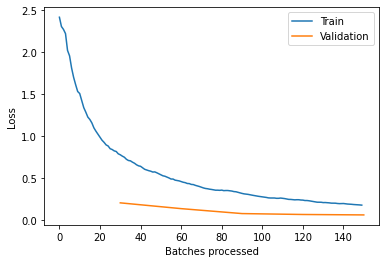

In [21]:
learn.recorder.plot_losses()

# Plot learning rate over time

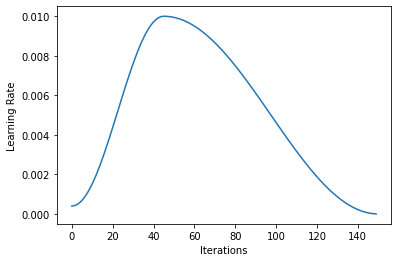

In [22]:
learn.recorder.plot_lr()

# Interpretation of learned Model

In [23]:
learn.save('stage-1')

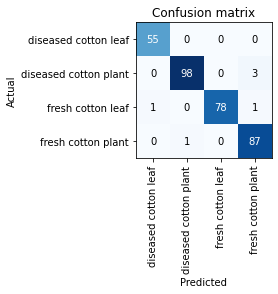

In [24]:
learn.load('stage-1')
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

# Unfreeze the top most layesr and retrain

In [26]:
learn.unfreeze()
learn.fit_one_cycle(5,lrs)

epoch,train_loss,valid_loss,error_rate,time
0,0.228481,2.848314,0.256173,01:06
1,0.218032,0.162381,0.027778,01:05
2,0.161032,0.070762,0.021605,01:05
3,0.116441,0.009749,0.003086,01:03
4,0.073508,0.019559,0.006173,01:04


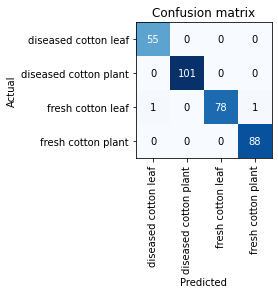

In [27]:
learn.save('stage-2')
learn.load('stage-2')
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [28]:
learn.fit_one_cycle(10,lrs)

epoch,train_loss,valid_loss,error_rate,time
0,0.022455,0.008129,0.003086,01:04
1,0.036129,0.024281,0.009259,01:04
2,0.104832,0.292813,0.055556,01:04
3,0.146007,0.928767,0.191358,01:03
4,0.128969,2.460114,0.293210,01:03
5,0.121482,0.020986,0.006173,01:03
6,0.091928,0.015588,0.003086,01:03
7,0.063891,0.011764,0.006173,01:02
8,0.038269,0.011180,0.006173,01:02
9,0.025946,0.009162,0.006173,01:02


# Show training results

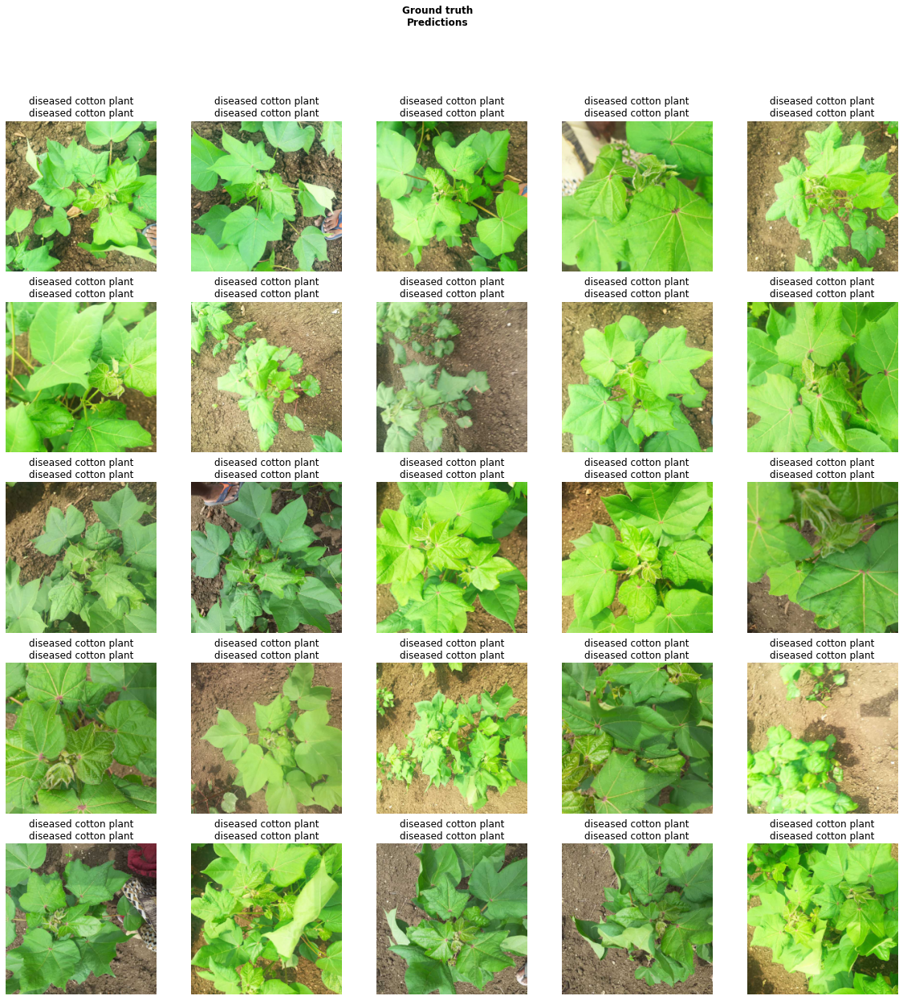

In [40]:
learn.show_results()

## Plot Confusion Matrix

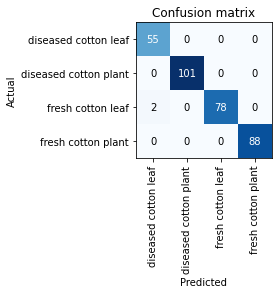

In [29]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

# Top 4 Missclassified Images

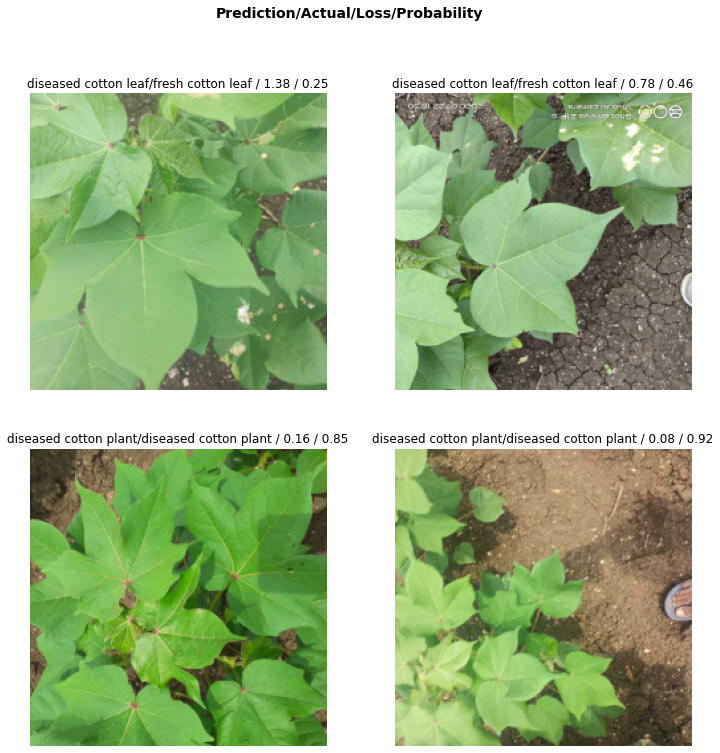

In [37]:
interp.plot_top_losses(4)

## Accuracy

In [30]:
preds,y =learn.get_preds(DatasetType.Valid)

In [31]:
print(f'Validation Accuracy : {accuracy(preds,y)}')

Validation Accuracy : 0.9938271641731262


# Prediction

In [44]:
data

ImageDataBunch;

Train: LabelList (1951 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
diseased cotton leaf,diseased cotton leaf,diseased cotton leaf,diseased cotton leaf,diseased cotton leaf
Path: /content/drive/My Drive/data;

Valid: LabelList (324 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
diseased cotton plant,diseased cotton plant,diseased cotton plant,diseased cotton plant,diseased cotton plant
Path: /content/drive/My Drive/data;

Test: LabelList (36 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: EmptyLabelList
,,,,
Path: /content/drive/My Drive/data

In [52]:
os.listdir('/content/drive/My Drive/data/test')

['diseased cotton plant',
 'diseased cotton leaf',
 'fresh cotton leaf',
 'fresh cotton plant',
 'test data comp files']

In [53]:
import os
test_img = [img for img in os.listdir('/content/drive/My Drive/data/test/diseased cotton plant')]

In [74]:
import PIL
import matplotlib.pyplot as plt

In [78]:
image_name = []
Label = []
for i in test_img:
  image_path = '/content/drive/My Drive/data/test/diseased cotton plant/' +i
  img = open_image(image_path)
  image_name.append(image_path)
  pred_class,pred_idx,outputs = learn.predict(img)
  Label.append(data.classes[outputs.argmax().item()])



In [61]:
import pandas as pd
df_disease_plant = pd.DataFrame({'Image':image_name,'Label':Label})
df_disease_plant.head()

,Image,Label
0,/content/drive/My Drive/data/test/diseased cot...,diseased cotton plant
1,/content/drive/My Drive/data/test/diseased cot...,diseased cotton plant
2,/content/drive/My Drive/data/test/diseased cot...,diseased cotton plant
3,/content/drive/My Drive/data/test/diseased cot...,diseased cotton plant
4,/content/drive/My Drive/data/test/diseased cot...,diseased cotton plant


In [98]:
df_disease_plant.shape

(5, 2)

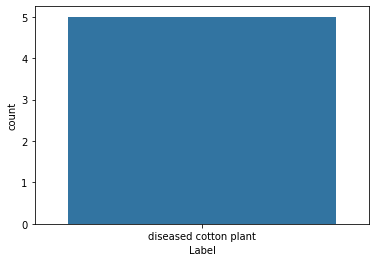

In [63]:
import seaborn as sns
sns.countplot(df_disease_plant['Label'])

* Hence determined that all the images in /content/drive/My Drive/data/test/diseased cotton plant/ folder has been correctly classified as **diseased**

# Visualize the first image in the folder

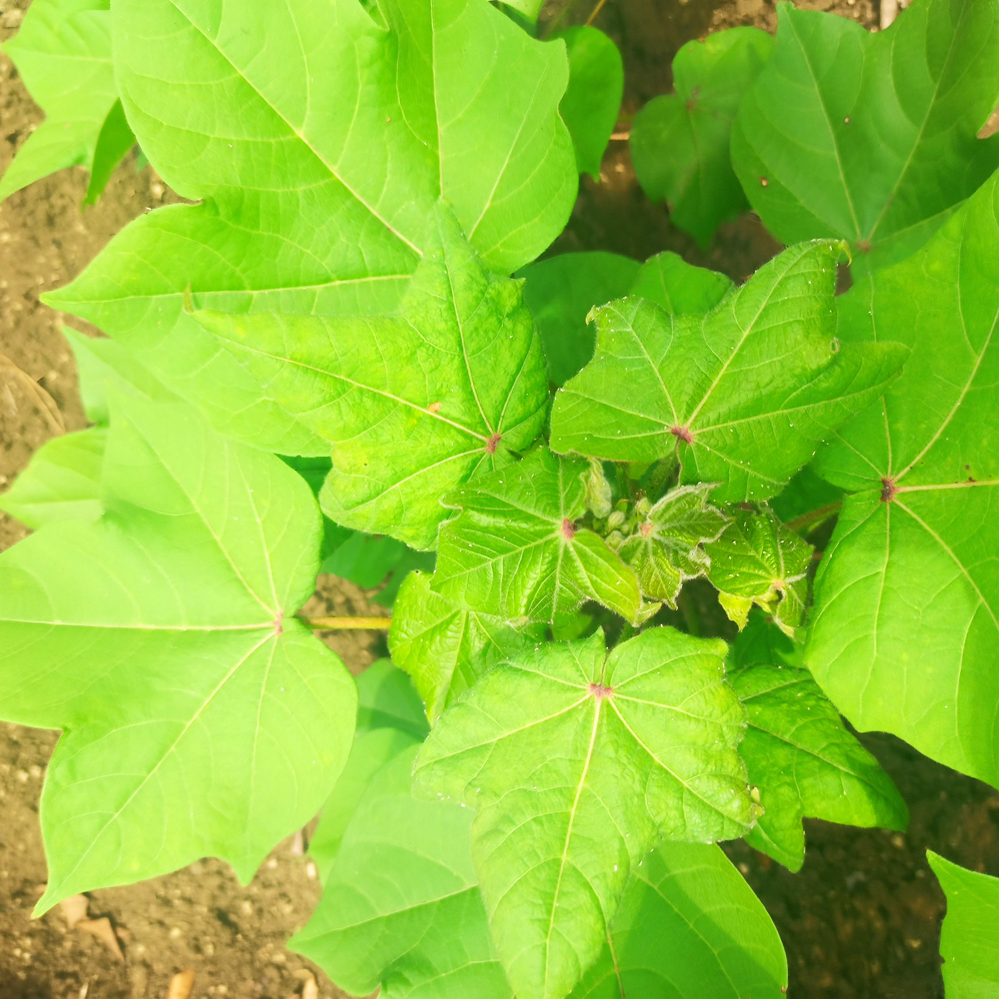

In [62]:
PIL.Image.open(df_disease_plant['Image'].values.tolist()[0])

In [97]:
img_list = [i for i in df_disease_plant['Image'].values.tolist()]
len(img_list)

5

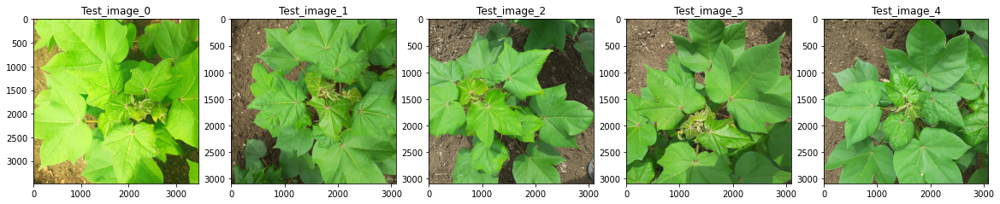

In [109]:
fig,ax = plt.subplots(1,5,figsize=(20,20))
img_list = [i for i in df_disease_plant['Image'].values.tolist()]
#filenames=[img_list[i] for i in range(10)] #or glob or any other way to describe filenames
for i in range(5):
    image=PIL.Image.open(img_list[i])
    ax[i].imshow(image)
    name = 'Test_image_' + str(i)
    ax[i].set_title(name)
fig.show()


In [93]:
for i in range(5):
    with open(filenames[i],'rb') as f:
        image=PIL.Image.open(f)
        ax[i%2][i//2].imshow(image)
fig.show()

# Predictions on the Test Set

In [70]:
DatasetType.Test.value

3

In [82]:
preds,y =learn.get_preds(DatasetType.Test)

In [39]:
preds

tensor([[2.5845e-05, 9.9990e-01, 1.4636e-05, 5.7139e-05],
        [2.1446e-08, 1.0000e+00, 4.7001e-08, 7.1827e-10],
        [5.7511e-06, 9.9998e-01, 5.5196e-06, 5.7006e-06],
        [9.5135e-05, 9.9879e-01, 8.0117e-05, 1.0381e-03],
        [5.3835e-06, 9.9998e-01, 4.2464e-06, 8.5532e-06],
        [1.0000e+00, 3.4989e-18, 8.6738e-14, 8.5256e-14],
        [1.0000e+00, 8.1394e-14, 1.8668e-11, 1.0576e-10],
        [9.9970e-01, 1.1154e-05, 3.1862e-05, 2.5610e-04],
        [2.0852e-10, 6.9014e-11, 1.0000e+00, 4.4135e-11],
        [9.4298e-10, 5.7611e-09, 1.0000e+00, 2.2106e-09],
        [3.4968e-05, 2.0354e-04, 9.9963e-01, 1.3496e-04],
        [8.9745e-08, 1.1315e-07, 1.0000e+00, 7.0593e-08],
        [6.1250e-07, 9.2692e-07, 1.0000e+00, 3.6266e-07],
        [1.5147e-06, 1.1838e-04, 2.3433e-05, 9.9986e-01],
        [4.7276e-08, 2.5369e-06, 6.8202e-07, 1.0000e+00],
        [2.8529e-10, 1.0596e-08, 3.2239e-08, 1.0000e+00],
        [1.1984e-06, 1.6387e-04, 6.2242e-06, 9.9983e-01],
        [8.646

# Display the first image in the test set

In [50]:
test_img[0]

'diseased cotton plant'

# Display the first image predicted by the Model

In [42]:
data.classes[preds[0].argmax().item()]

'diseased cotton plant'

In [60]:
data.classes[preds[1].argmax().item()]

'diseased cotton plant'

# Print Labels

In [66]:
for i in preds:
  print(f'LABEL PREDICTED : {data.classes[i.argmax().item()]}')
  print('\n')

LABEL PREDICTED : diseased cotton plant


LABEL PREDICTED : diseased cotton plant


LABEL PREDICTED : diseased cotton plant


LABEL PREDICTED : diseased cotton plant


LABEL PREDICTED : diseased cotton plant


LABEL PREDICTED : diseased cotton leaf


LABEL PREDICTED : diseased cotton leaf


LABEL PREDICTED : diseased cotton leaf


LABEL PREDICTED : fresh cotton leaf


LABEL PREDICTED : fresh cotton leaf


LABEL PREDICTED : fresh cotton leaf


LABEL PREDICTED : fresh cotton leaf


LABEL PREDICTED : fresh cotton leaf


LABEL PREDICTED : fresh cotton plant


LABEL PREDICTED : fresh cotton plant


LABEL PREDICTED : fresh cotton plant


LABEL PREDICTED : fresh cotton plant


LABEL PREDICTED : fresh cotton plant


LABEL PREDICTED : diseased cotton leaf


LABEL PREDICTED : diseased cotton leaf


LABEL PREDICTED : fresh cotton leaf


LABEL PREDICTED : fresh cotton leaf


LABEL PREDICTED : fresh cotton plant


LABEL PREDICTED : fresh cotton plant


LABEL PREDICTED : fresh cotton plant


LABEL P